<a href="https://colab.research.google.com/github/krittikabarua/Bird-Species-Identification-using-Supervised-Decision-Tree-Model-and-CNN-EfficientNet-Mode/blob/main/PRL_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install tensorflow==2.9.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.7/511.7 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.7/438.7 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 11.6 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.5.26
    Uninstalling flatbuffers-23.5.26:
      Successfully uninstalled flatbuffers-23.5.26
  Attempting uninstall: ten

In [ ]:
# import system libs
import os
import time
import shutil
import pathlib
import itertools
from PIL import Image

# import data handling tools
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
# import Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers
# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

modules loaded


Data-Visualzation

In [ ]:
train_dir = '/content/drive/MyDrive/bird_species_project/Bird_species_dataset/Train'
filepaths = []
labels = []

folds = os.listdir(train_dir)
for fold in folds:
    foldpath = os.path.join(train_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
train_df = pd.concat([Fseries, Lseries], axis= 1)

In [ ]:
train_df

,filepaths,labels
0,/content/drive/MyDrive/bird_species_project/Bi...,Cerulean_Warbler
1,/content/drive/MyDrive/bird_species_project/Bi...,Cerulean_Warbler
2,/content/drive/MyDrive/bird_species_project/Bi...,Cerulean_Warbler
3,/content/drive/MyDrive/bird_species_project/Bi...,Cerulean_Warbler
4,/content/drive/MyDrive/bird_species_project/Bi...,Cerulean_Warbler
...,...,...
5014,/content/drive/MyDrive/bird_species_project/Bi...,Horned_Lark
5015,/content/drive/MyDrive/bird_species_project/Bi...,Horned_Lark
5016,/content/drive/MyDrive/bird_species_project/Bi...,Horned_Lark
5017,/content/drive/MyDrive/bird_species_project/Bi...,Horned_Lark


In [ ]:
valid_dir = '/content/drive/MyDrive/bird_species_project/Bird_species_dataset/Test'
filepaths = []
labels = []

folds = os.listdir(train_dir)
for fold in folds:
    foldpath = os.path.join(train_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
valid_df = pd.concat([Fseries, Lseries], axis= 1)

In [ ]:
valid_df

,filepaths,labels
0,/content/drive/MyDrive/bird_species_project/Bi...,Cerulean_Warbler
1,/content/drive/MyDrive/bird_species_project/Bi...,Cerulean_Warbler
2,/content/drive/MyDrive/bird_species_project/Bi...,Cerulean_Warbler
3,/content/drive/MyDrive/bird_species_project/Bi...,Cerulean_Warbler
4,/content/drive/MyDrive/bird_species_project/Bi...,Cerulean_Warbler
...,...,...
5014,/content/drive/MyDrive/bird_species_project/Bi...,Horned_Lark
5015,/content/drive/MyDrive/bird_species_project/Bi...,Horned_Lark
5016,/content/drive/MyDrive/bird_species_project/Bi...,Horned_Lark
5017,/content/drive/MyDrive/bird_species_project/Bi...,Horned_Lark


In [ ]:
# crobed image size
batch_size = 32
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

tr_gen = ImageDataGenerator()
ts_gen = ImageDataGenerator()
train_gen = tr_gen.flow_from_dataframe( train_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)
valid_gen = ts_gen.flow_from_dataframe( valid_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)


Found 5019 validated image filenames belonging to 107 classes.
Found 5019 validated image filenames belonging to 107 classes.


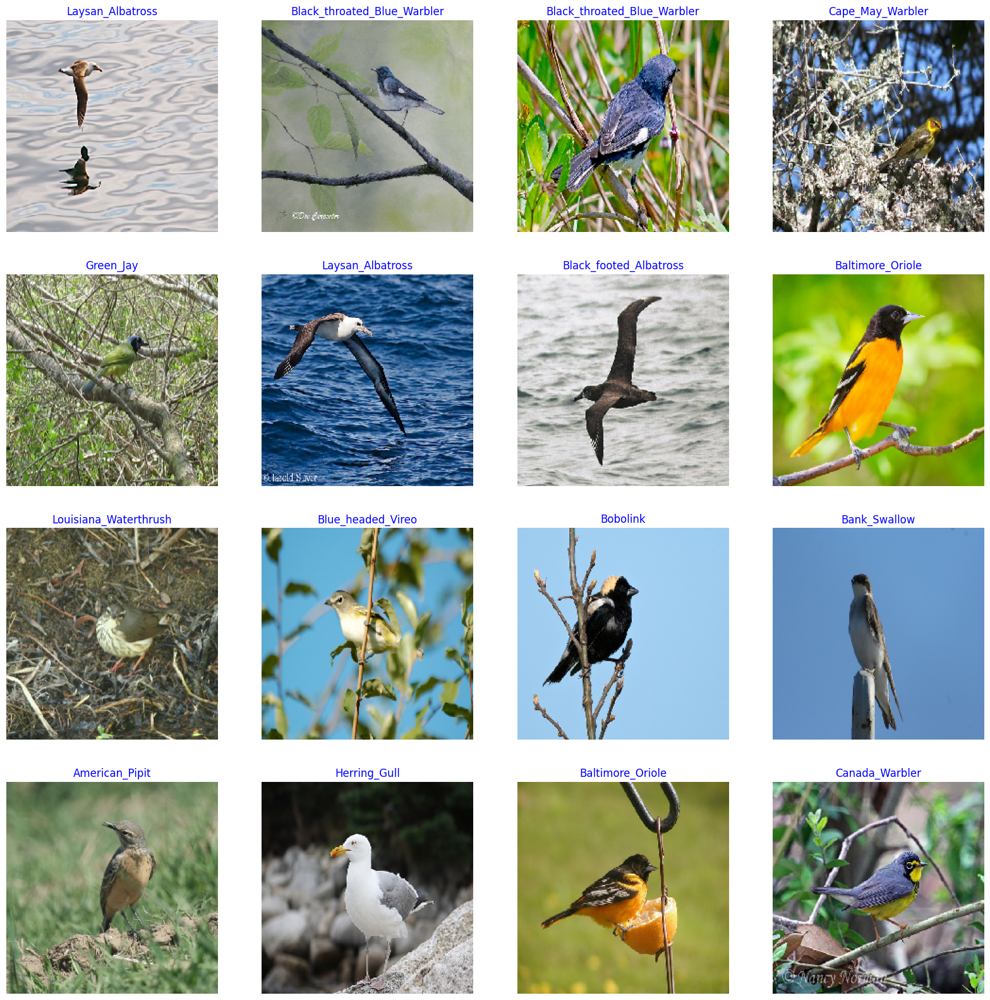

In [ ]:
g_dict = train_gen.class_indices      # defines dictionary {'class': index}
classes = list(g_dict.keys())       # defines list of dictionary's kays (classes), classes names : string
images, labels = next(train_gen)      # get a batch size samples from the generator

plt.figure(figsize= (20, 20))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i] / 255       # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name, color= 'blue', fontsize= 12)
    plt.axis('off')
plt.show()

Shearing-Preprocessing

Found 5019 images belonging to 109 classes.


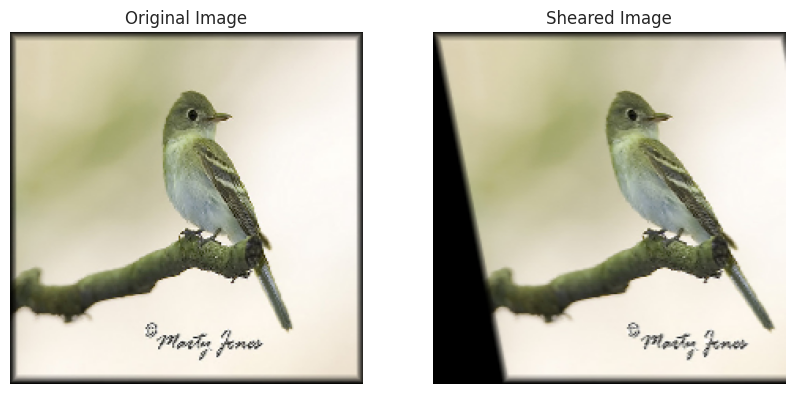

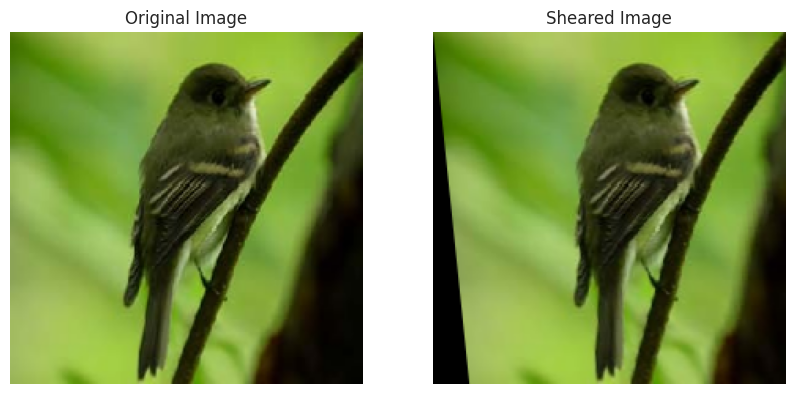

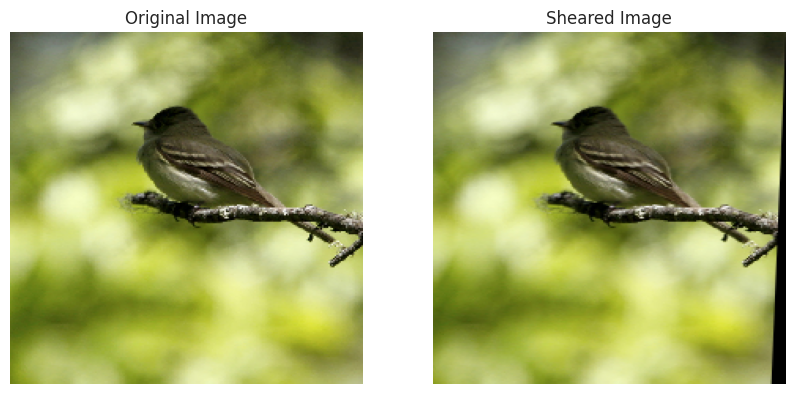

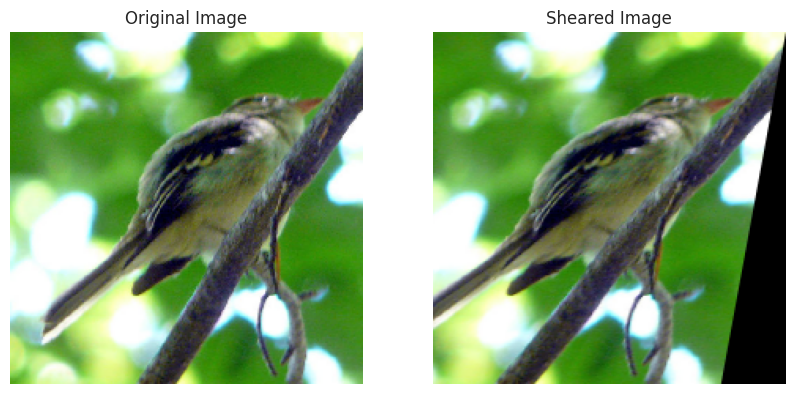

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import transform
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define your dataset directory
#dataset_dir = "/content/drive/MyDrive/PRL_project/Bird_spices/train"

# Define shearing parameters
shear_params = {
    'shear_range': 0.2,  # Adjust as needed
    'row_axis': 0,
    'col_axis': 1,
    'channel_axis': 2
}

# Create an ImageDataGenerator with shearing augmentation
datagen = ImageDataGenerator(
    shear_range=shear_params['shear_range']
)

# Flow images from directory
data_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Adjust as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Function to apply shearing to an image batch
def apply_shear_to_batch(batch_images, shear_range=0.2, row_axis=0, col_axis=1, channel_axis=2):
    sheared_images = []
    for image in batch_images:
        shear_factor = np.random.uniform(-shear_range, shear_range)
        shear_matrix = np.array([[1, -shear_factor, 0],
                                 [0, 1, 0],
                                 [0, 0, 1]])
        sheared_image = transform.warp(image, shear_matrix)
        sheared_images.append(sheared_image)
    return np.array(sheared_images)

# Iterate through the dataset generator and apply shearing
for batch_images, batch_labels in data_generator:
    sheared_batch_images = apply_shear_to_batch(batch_images, **shear_params)
    # Display 4 original and sheared images from the batch
    for i in range(4):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(batch_images[i].astype(np.uint8))
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title("Sheared Image")
        plt.imshow(sheared_batch_images[i].astype(np.uint8))
        plt.axis('off')

        plt.show()
    break  # Break after displaying the first batch


Rotation_Preprocessing

Found 5019 images belonging to 109 classes.


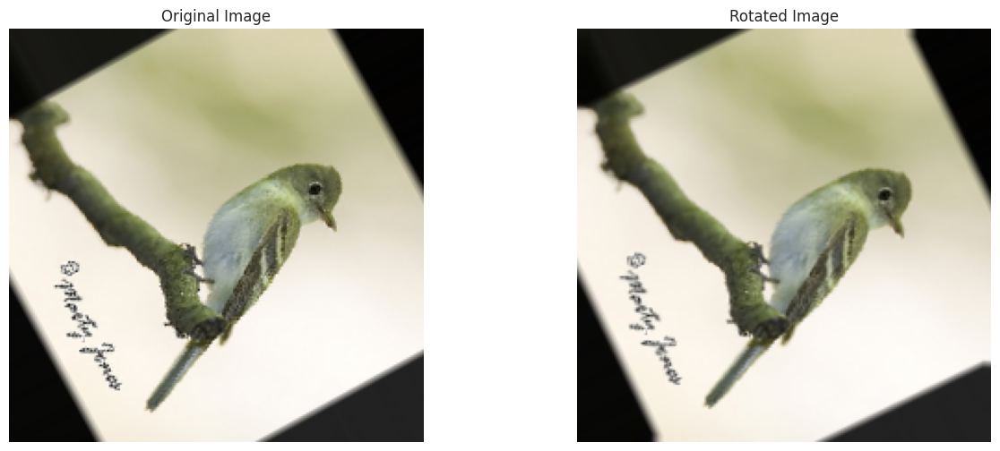

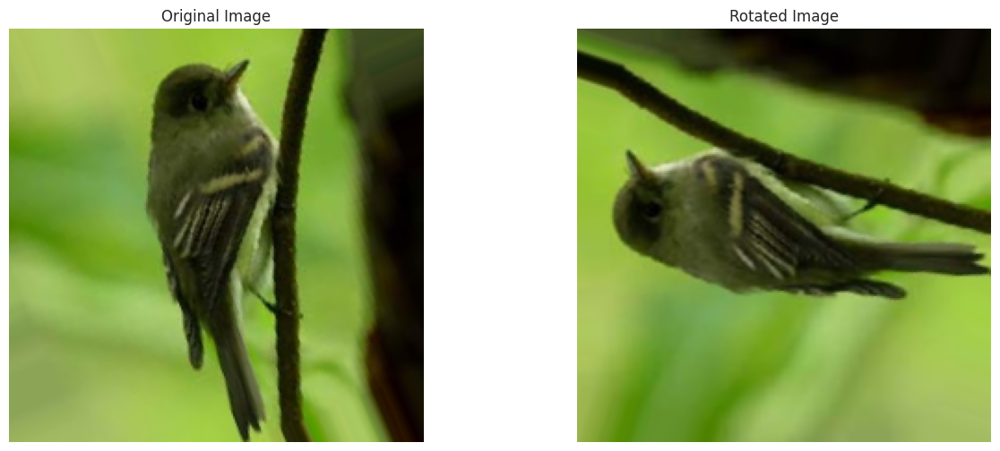

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define your dataset directory
#dataset_dir = "/content/drive/MyDrive/PRL_project/Bird_spices/train"

# Create an ImageDataGenerator with rotation augmentation
datagen = ImageDataGenerator(
    rotation_range=100,
    rescale=1./255  # Normalization: rescale pixel values to range [0,1]
)

# Flow images from directory
data_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Adjust as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Display original and rotated images
for batch_images, batch_labels in data_generator:
    # Display 5 original and rotated images from the batch
    for i in range(2):
        plt.figure(figsize=(15, 6))

        # Plot original image
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(batch_images[i])
        plt.axis('off')

        # Apply rotation augmentation
        rotated_image = datagen.random_transform(batch_images[i])

        # Plot rotated image
        plt.subplot(1, 2, 2)
        plt.title("Rotated Image")
        plt.imshow(rotated_image)
        plt.axis('off')

        plt.show()

        if i == 4:
            break

    break  # Break after displaying the first batch



Bluring-Preprocessing

Found 5019 images belonging to 109 classes.


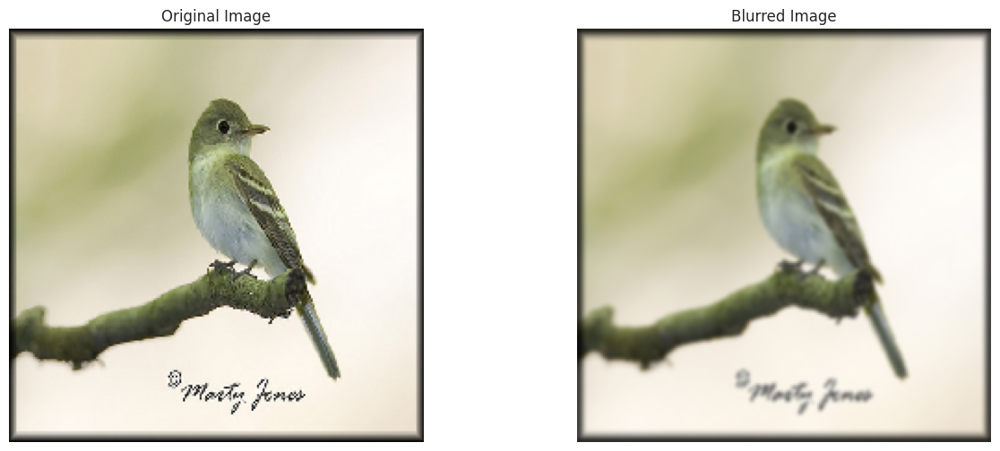

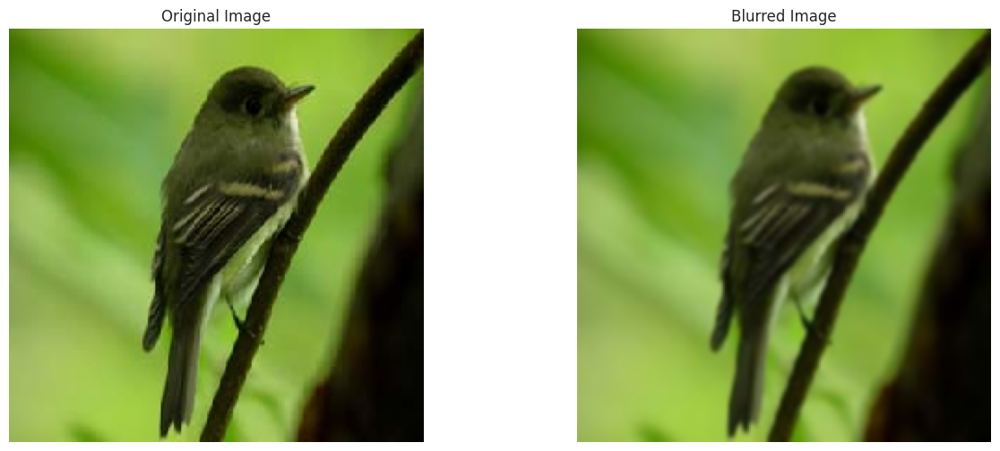

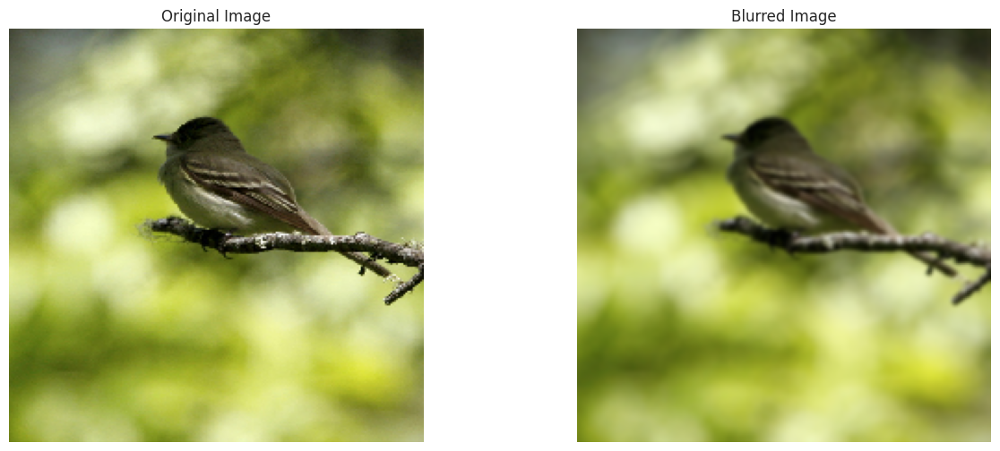

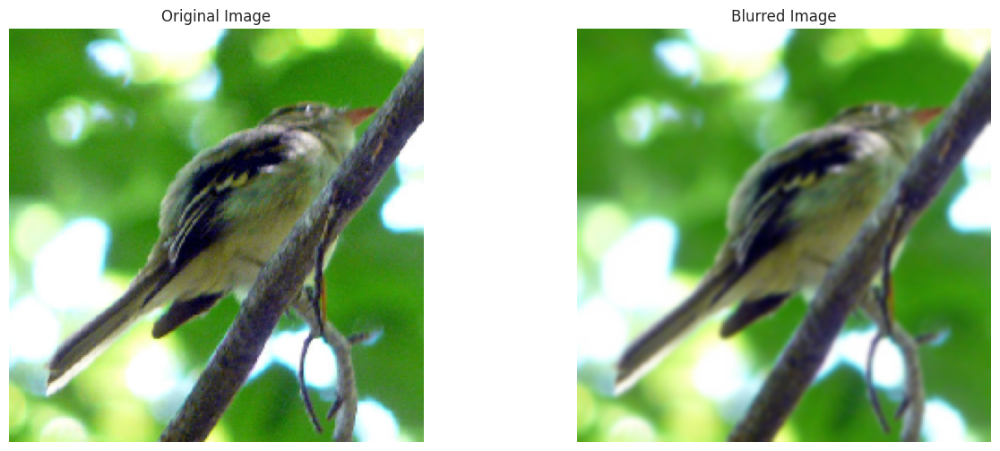

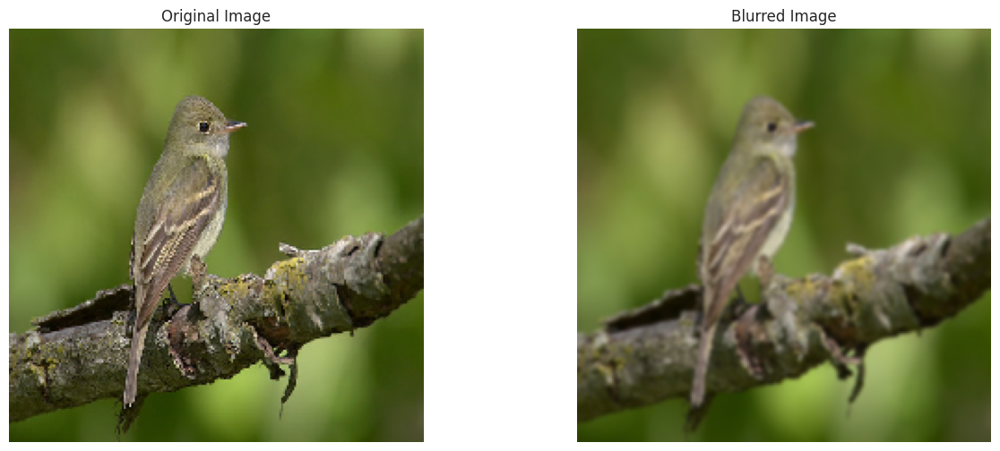

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define your dataset directory
#dataset_dir = "/content/drive/MyDrive/PRL_project/Bird_spices/train"

# Function to apply blur augmentation
def apply_blur(image):
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)  # Apply Gaussian blur with a kernel size of (5, 5)
    return blurred_image

# Create an ImageDataGenerator
datagen = ImageDataGenerator(
    rescale=1./255  # Normalization: rescale pixel values to range [0,1]
)

# Flow images from directory
data_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Adjust as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Iterate through the dataset generator
for batch_images, batch_labels in data_generator:
    # Display 5 original and blurred images from the batch
    for i in range(5):
        plt.figure(figsize=(15, 6))

        # Plot original image
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(batch_images[i])
        plt.axis('off')

        # Apply blur augmentation
        blurred_image = apply_blur(batch_images[i])

        # Plot blurred image
        plt.subplot(1, 2, 2)
        plt.title("Blurred Image")
        plt.imshow(blurred_image)
        plt.axis('off')

        plt.show()

        if i == 4:
            break

    break  # Break after displaying the first batch


Global-thresholding

Found 5019 images belonging to 109 classes.


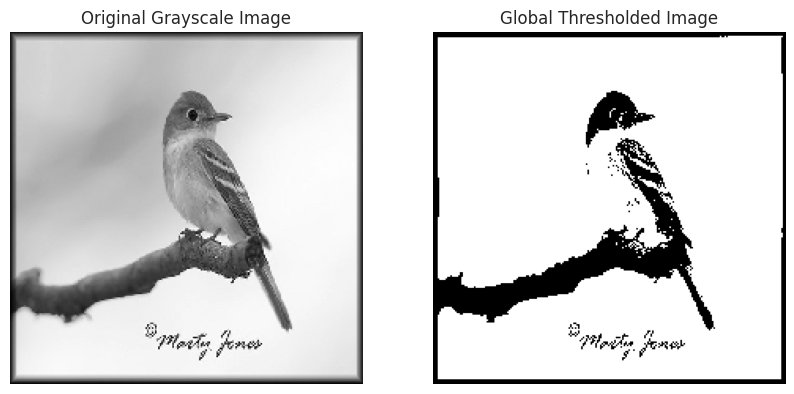

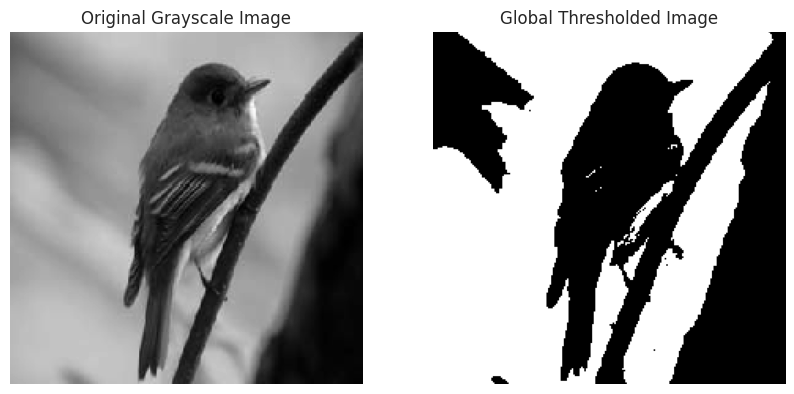

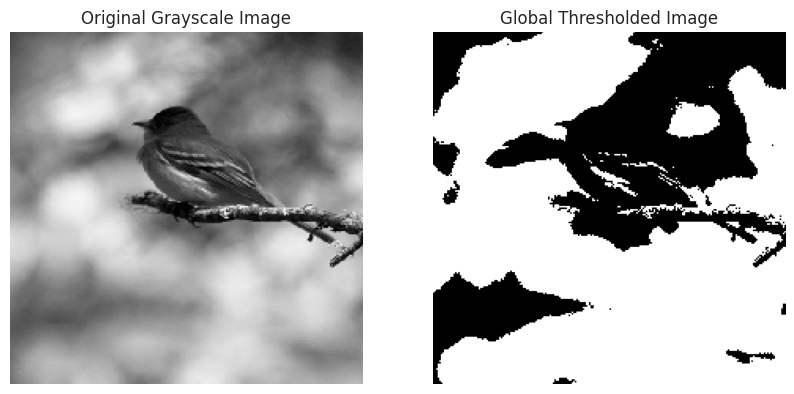

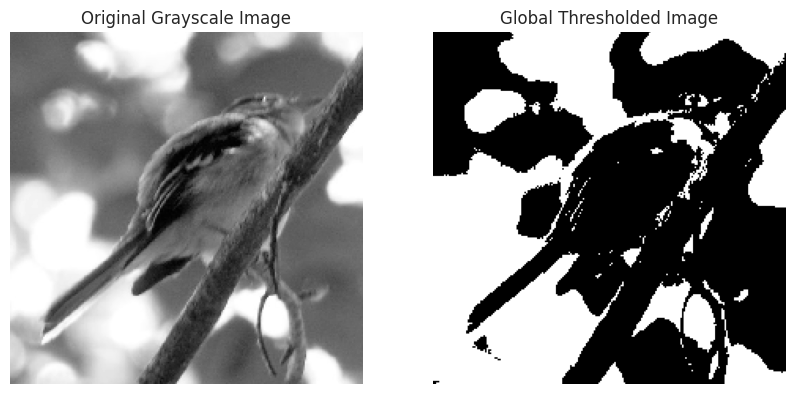

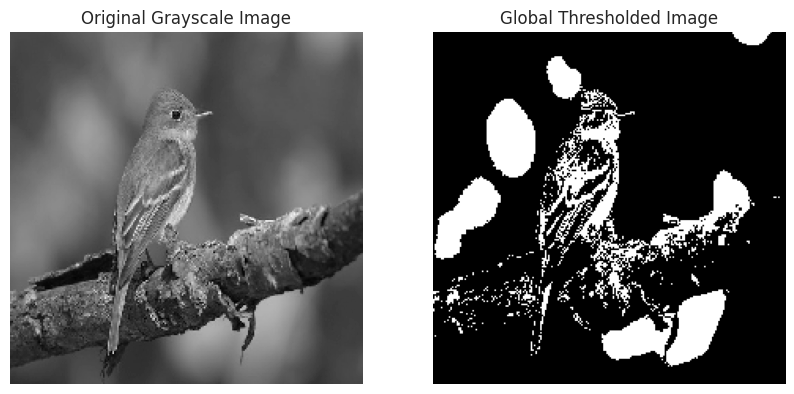

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define your dataset directory
#dataset_dir = "/content/drive/MyDrive/PRL_project/Bird_spices/train"

# Function to apply global thresholding
def apply_global_threshold(image):
    _, thresholded_image = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY)  # Adjust threshold value as needed
    return thresholded_image

# Create an ImageDataGenerator without normalization
datagen = ImageDataGenerator()

# Flow images from directory
data_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Adjust as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=False,
    color_mode='grayscale'  # Load images in grayscale
)

# Iterate through the dataset generator
for batch_images, batch_labels in data_generator:
    # Display 5 original and thresholded images from the batch
    for i in range(5):
        plt.figure(figsize=(10, 5))

        # Plot original grayscale image
        plt.subplot(1, 2, 1)
        plt.title("Original Grayscale Image")
        plt.imshow(batch_images[i].squeeze(), cmap='gray')  # Squeeze to remove the channel dimension
        plt.axis('off')

        # Apply global thresholding
        thresholded_image = apply_global_threshold(batch_images[i].squeeze())

        # Plot thresholded image
        plt.subplot(1, 2, 2)
        plt.title("Global Thresholded Image")
        plt.imshow(thresholded_image, cmap='gray')
        plt.axis('off')

        plt.show()

    break  # Break after displaying the first batch


In [ ]:
!pip install opencv-python

Canny_edge_Detection

Found 5019 images belonging to 109 classes.


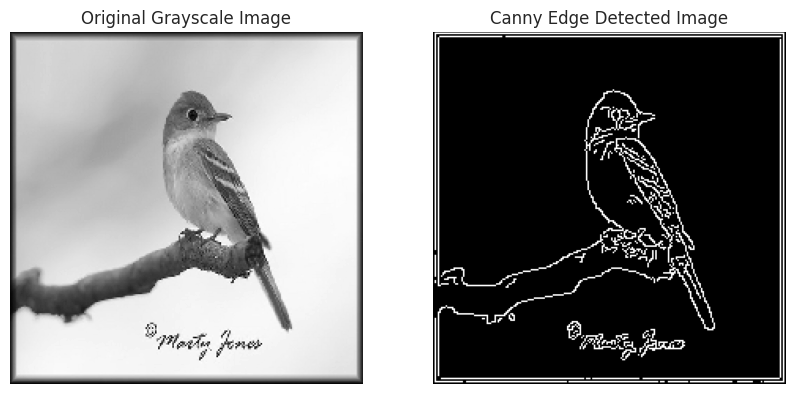

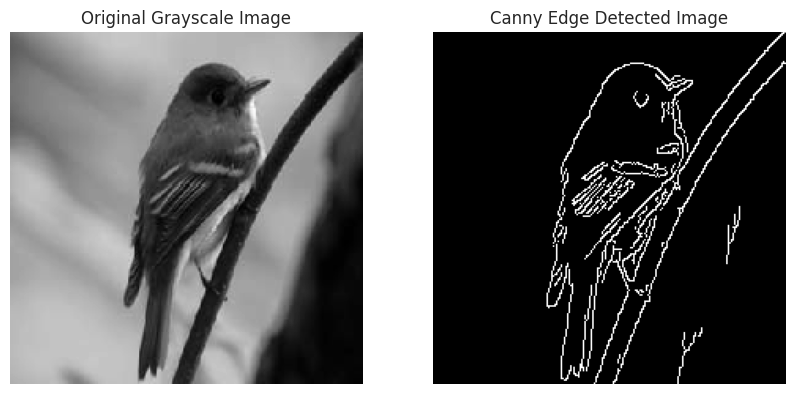

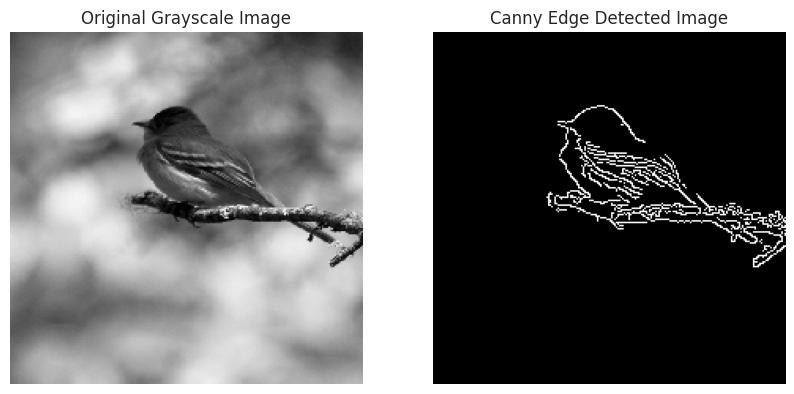

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define your dataset directory
#dataset_dir = "/content/drive/MyDrive/PRL_project/Bird_spices/train"

# Function to apply Canny edge detection
def apply_canny_edge_detection(image):
    edges = cv2.Canny(image, 100, 200)  # Adjust thresholds as needed
    return edges

# Create an ImageDataGenerator without normalization
datagen = ImageDataGenerator()

# Flow images from directory
data_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Adjust as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=False,
    color_mode='grayscale'  # Load images in grayscale
)

# Iterate through the dataset generator
for batch_images, batch_labels in data_generator:
    # Display 5 original and edge-detected images from the batch
    for i in range(3):
        plt.figure(figsize=(10, 5))

        # Plot original grayscale image
        plt.subplot(1, 2, 1)
        plt.title("Original Grayscale Image")
        plt.imshow(batch_images[i].squeeze(), cmap='gray')  # Squeeze to remove the channel dimension
        plt.axis('off')

        # Apply Canny edge detection
        edge_image = apply_canny_edge_detection(batch_images[i].squeeze().astype(np.uint8))

        # Plot edge-detected image
        plt.subplot(1, 2, 2)
        plt.title("Canny Edge Detected Image")
        plt.imshow(edge_image, cmap='gray')
        plt.axis('off')

        plt.show()

    break  # Break after displaying the first batch


Decision Tree -Model

In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.models import Model
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score


# Load the pre-trained EfficientNetB0 model without the top classification layer
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the weights of the pre-trained model so they are not updated during training
base_model.trainable = False

# Define a new model with the desired output layer
feature_extractor = Model(inputs=base_model.input, outputs=base_model.output)

# Function to extract features from a batch of images
def extract_features(model, images):
    # Preprocess the images
    images = preprocess_input(images)
    # Extract features using the model
    features = model.predict(images)
    return features

# Extract features from training data
X_train = []
y_train = []
# Iterate directly through the data generator using a for loop
for images, labels in train_gen:
    batch_features = extract_features(feature_extractor, images)
    X_train.extend(batch_features)
    y_train.extend(labels)


# Extract features from test data
X_test = []
y_test = []
# Iterate directly through the data generator using a for loop
for images, labels in valid_gen:
    batch_features = extract_features(feature_extractor, images)
    X_test.extend(batch_features)
    y_test.extend(labels)

# Convert lists to numpy arrays
X_train = np.array(X_train)
# Reshape X_train to have 2 dimensions
X_train = X_train.reshape(X_train.shape[0], -1)
y_train = np.array(y_train)

# Train the decision tree classifier
#dt_classifier.fit(X_train, y_train)

X_test = np.array(X_test)
X_test = X_test.reshape(X_test.shape[0], -1)
y_test = np.array(y_test)

# Initialize the decision tree classifier
dt_classifier = DecisionTreeClassifier()

# Train the decision tree classifier
dt_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_test_pred = dt_classifier.predict( X_test)

# Calculate accuracy on test data

accuracy_test = accuracy_score(y_test, y_test_pred)
print("Test Accuracy:", accuracy_test)


decision_train = round(dt_classifier.score(X_train, y_train) * 100, 2)
decision_accuracy = round(accuracy_score(y_test, y_test_pred ) * 100, 2)
print("Training Accuracy    :",decision_train ,"%")
print("Model Accuracy Score :",decision_accuracy ,"%")

NameError: name 'train_gen' is not defined

**Effiencintnet** model

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121,DenseNet169,EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D,GlobalMaxPooling2D, Dropout, BatchNormalization, Reshape, Multiply, Add, Conv2D, Concatenate
from tensorflow.keras.models import Model

# Load MobileNetV3-Large pretrained model
base_model = EfficientNetB0(
    input_shape=(224,224, 3),
    include_top=False,
    weights="imagenet",

)

# Freeze pre-trained layers
for layer in base_model.layers[:50]:
    layer.trainable = False

# Define new classifier layers
# x = cbam_block(x)
x = base_model.output
x = Dropout(0.5)(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(1024, activation='mish')(x)
x = BatchNormalization()(x)
x = Dense(1024, activation='mish')(x)

# Apply CBAM block
# x = cbam_block(x)

predictions = Dense(107, activation='softmax')(x)  # Number of classes in your new dataset

# Combine base model and new classifier layers
model = Model(inputs=base_model.input, outputs=predictions)

# Print model summary
model.summary()


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 6,524,686 (24.89 MB)

 Trainable params: 6,457,781 (24.63 MB)

 Non-trainable params: 66,905 (261.35 KB)

In [ ]:
model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=1e-4,weight_decay=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:

# # Create Model Structure
# img_size = (224, 224)
# channels = 3
# img_shape = (img_size[0], img_size[1], channels)
# class_count = len(list(train_gen.class_indices.keys())) # to define number of classes in dense layer

# # create pre-trained model (you can built on pretrained model such as :  efficientnet, VGG , Resnet )
# # we will use efficientnetb3 from EfficientNet family.
# base_model = tf.keras.applications.efficientnet.EfficientNetB0(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')
# # base_model.trainable = False
# model = Sequential([
#     base_model,
#     BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
#     Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
#                 bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
#     Dropout(rate= 0.45, seed= 123),
#     Dense(class_count, activation= 'softmax')
# ])

# model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

# model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional  (None, 1280)              4049571   
 )                                                               
                                                                 
 batch_normalization_1 (Bat  (None, 1280)              5120      
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 256)               327936    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 30)                7710      
                                                                 
Total params: 4390337 (16.75 MB)
Trainable params: 434

Train model

In [ ]:
batch_size = 32   # set batch size for training
epochs =  4  # number of all epochs in training
history = model.fit(x= train_gen, epochs= epochs, verbose= 1, validation_data= valid_gen,
                    validation_steps= None, shuffle= False)

# Get training and validation accuracy
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Print the training and validation accuracy
print(f'Training Accuracy: {train_accuracy[-1]:.4f}')
print(f'Validation Accuracy: {val_accuracy[-1]:.4f}')


Epoch 1/4
157/157 ━━━━━━━━━━━━━━━━━━━━ 67s 426ms/step - accuracy: 0.9424 - loss: 0.2425 - val_accuracy: 0.9962 - val_loss: 0.0297
Epoch 2/4
157/157 ━━━━━━━━━━━━━━━━━━━━ 66s 422ms/step - accuracy: 0.9601 - loss: 0.1736 - val_accuracy: 0.9968 - val_loss: 0.0204
Epoch 3/4
157/157 ━━━━━━━━━━━━━━━━━━━━ 75s 476ms/step - accuracy: 0.9647 - loss: 0.1488 - val_accuracy: 0.9994 - val_loss: 0.0123
Epoch 4/4
157/157 ━━━━━━━━━━━━━━━━━━━━ 66s 422ms/step - accuracy: 0.9718 - loss: 0.1257 - val_accuracy: 0.9996 - val_loss: 0.0075
Training Accuracy: 0.9751
Validation Accuracy: 0.9996


Display model performance

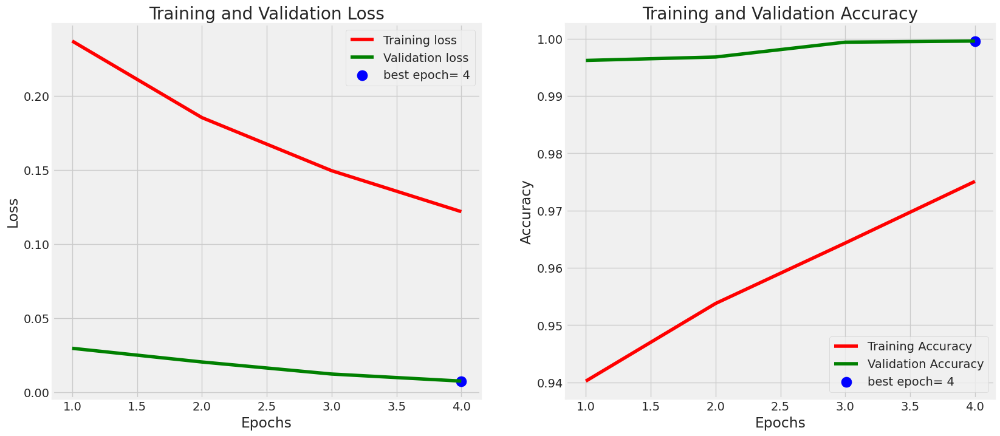

In [ ]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'
# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')
plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.tight_layout
plt.show()

Evaluate model

In [ ]:
ts_length = len(valid_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)


239/239 ━━━━━━━━━━━━━━━━━━━━ 34s 140ms/step - accuracy: 0.9995 - loss: 0.0079
239/239 ━━━━━━━━━━━━━━━━━━━━ 33s 137ms/step - accuracy: 0.9997 - loss: 0.0073
Train Loss:  0.007507034111768007
Train Accuracy:  0.9996015429496765
--------------------
Validation Loss:  0.007507035508751869
Validation Accuracy:  0.9996015429496765
--------------------


Get Predictions

157/157 ━━━━━━━━━━━━━━━━━━━━ 32s 203ms/step
                                precision    recall  f1-score   support

            Acadian_Flycatcher       0.02      0.02      0.02        47
                 American_Crow       0.00      0.00      0.00        48
            American_Goldfinch       0.00      0.00      0.00        48
                American_Pipit       0.00      0.00      0.00        48
             American_Redstart       0.00      0.00      0.00        48
American_Three_toed_Woodpecker       0.03      0.03      0.03        40
              Anna_Hummingbird       0.00      0.00      0.00        48
                    Artic_Tern       0.00      0.00      0.00        46
                 Baird_Sparrow       0.03      0.03      0.03        40
              Baltimore_Oriole       0.00      0.00      0.00        48
                  Bank_Swallow       0.02      0.02      0.02        47
                  Barn_Swallow       0.00      0.00      0.00        48
          Bay_breas

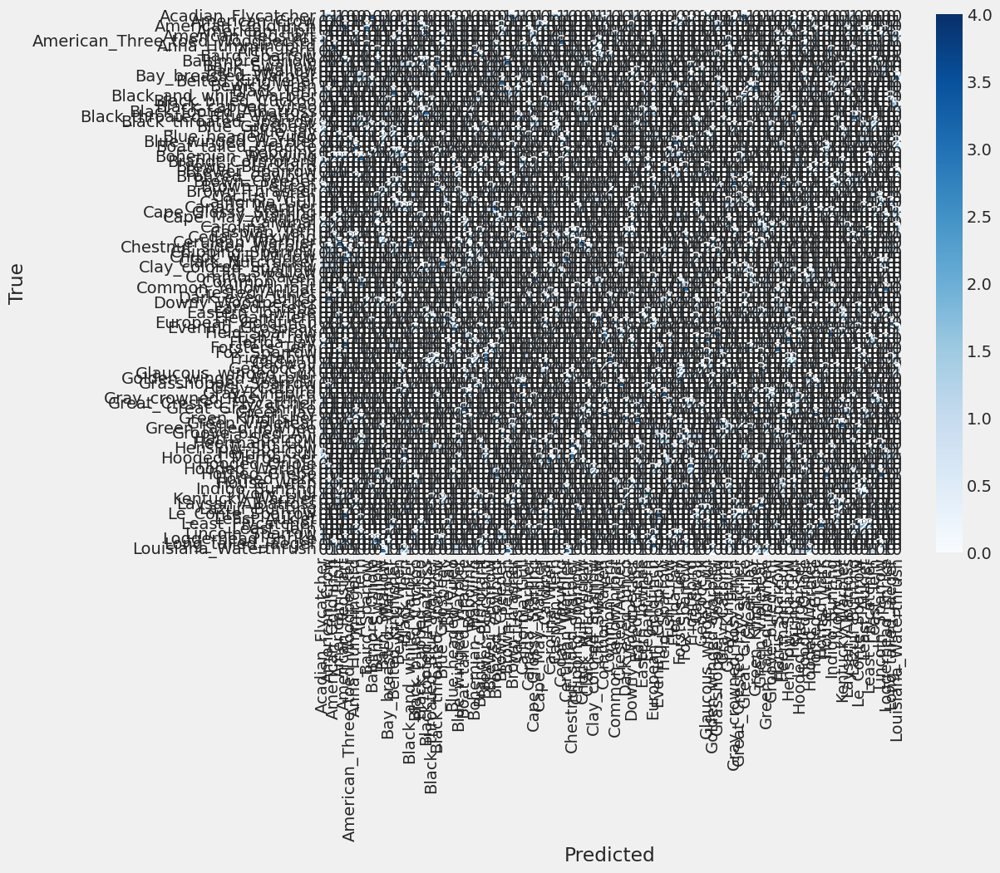

In [ ]:
# Classification report
from sklearn.metrics import classification_report, confusion_matrix
y_pred = model.predict(valid_gen)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = valid_gen.classes

print(classification_report(y_true, y_pred_classes, target_names=list(valid_gen.class_indices.keys())))

# Confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=valid_gen.class_indices.keys(), yticklabels=valid_gen.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

Confusion Matrics and Classification Report

Save model

In [ ]:
model.save('/content/drive/MyDrive/bird_species_project/bird_project_model.h5')

In [ ]:
loaded_model = tf.keras.models.load_model('/content/drive/MyDrive/bird_species_project/bird_project_model.h5')


ROC_CURVE

157/157 ━━━━━━━━━━━━━━━━━━━━ 32s 201ms/step


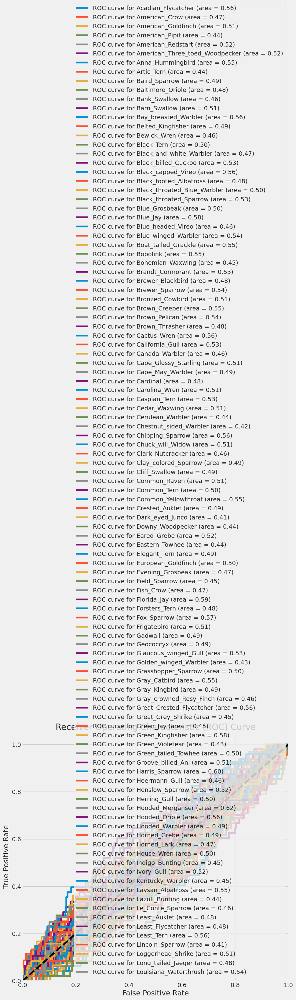

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have your test generator 'test_gen' and your EfficientNet model 'loaded_model' already defined

# Generate predictions
y_pred_probs = loaded_model.predict(valid_gen)

# Convert true labels to one-hot encoding
y_true = label_binarize(valid_gen.classes, classes=np.arange(len(classes)))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 10))
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], label='ROC curve for {} (area = {:.2f})'.format(classes[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')  # Plot diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


Prediction using loaded_model

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


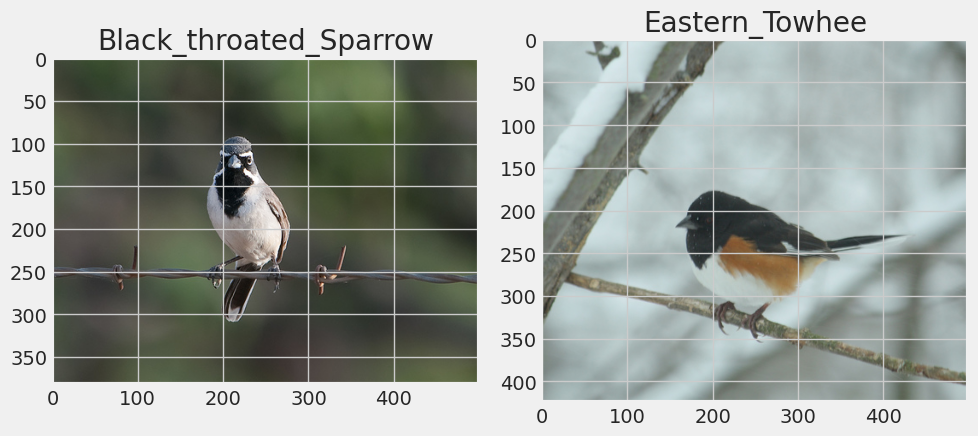

In [ ]:
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt



# Function to preprocess, predict, and display an image
def preprocess_predict_display(image_path, ax):
    # Load and preprocess the image
    image = Image.open(image_path)
    img = image.resize((224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)

    # Make predictions
    predictions = loaded_model.predict(img_array)
    class_labels = classes
    score = tf.nn.softmax(predictions[0])
    predicted_class = class_labels[tf.argmax(score)]

    # Display the image and predicted label
    ax.imshow(image)
    ax.set_title(predicted_class)

# Paths to your two images
image_paths = ['/content/drive/MyDrive/bird_species_project/Bird_species_dataset/Test/Black_throated_Sparrow/Black_Throated_Sparrow_0002_106962.jpg',
               '/content/drive/MyDrive/bird_species_project/Bird_species_dataset/Test/Eastern_Towhee/Eastern_Towhee_0018_22546.jpg']

# Create a horizontal subplot
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Process, predict, and display each image
for i, path in enumerate(image_paths):
    preprocess_predict_display(path, axes[i])

plt.tight_layout()
plt.show()
